<a href="https://colab.research.google.com/github/adriancm16/Machine_Learning/blob/main/Clasification_Parkinson/parkinsonDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PARKINSON DETECTION CLASIFICATION


The dataset was created by Max Little of the University of Oxford, in collaboration with the National Centre for Voice and Speech, Denver, Colorado, who recorded the speech signals. The original study published the feature extraction methods for general voice disorders


DATASET INFORMATION:

This dataset is composed of a range of biomedical voice measurements from 31 people, 23 with Parkinson's disease (PD). Each column in the table is a particular voice measure, and each row corresponds one of 195 voice recording from these individuals ("name" column). The main aim of the data is to discriminate healthy people from those with PD, according to "status" column which is set to 0 for healthy and 1 for PD.

ATRIBUTE INFORMATION

Matrix column entries (attributes):

name - ASCII subject name and recording number

MDVP:Fo(Hz) - Average vocal fundamental frequency

MDVP:Fhi(Hz) - Maximum vocal fundamental frequency

MDVP:Flo(Hz) - Minimum vocal fundamental frequency

MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP - Several measures of variation in fundamental frequency

MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA - Several measures of variation in amplitude

NHR,HNR - Two measures of ratio of noise to tonal components in the voice status - Health status of the subject (one) - Parkinson's, (zero) - healthy RPDE,D2 - Two nonlinear dynamical complexity measures

DFA - Signal fractal scaling exponent spread1,spread2,PPE - Three nonlinear measures of fundamental frequency variation

Citation:

 'Exploiting Nonlinear Recurrence and Fractal Scaling Properties for Voice Disorder Detection', Little MA, McSharry PE, Roberts SJ, Costello DAE, Moroz IM. BioMedical Engineering OnLine 2007, 6:23 (26 June 2007)

## 2_Algoritmo Detección de la enfermedad de Parkinson con XGBoost
Para Predicción de la enfermedad de Parkinson por trastornos vocales.

In [ ]:
## Importacion de Librerias Necesarias
import numpy as np
import pandas as pd
import os, sys
from sklearn.preprocessing import MinMaxScaler
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [ ]:
## Importacion de Dataset
url="https://drive.google.com/uc?export=download&id=1245WhGzkditE-OtDQzlmPptMFZ_zESFE"
df_park=pd.read_csv(url)

In [ ]:
df_park.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MDVP:Fo(Hz)       195 non-null    float64
 1   MDVP:Fhi(Hz)      195 non-null    float64
 2   MDVP:Flo(Hz)      195 non-null    float64
 3   MDVP:Jitter(%)    195 non-null    float64
 4   MDVP:Jitter(Abs)  195 non-null    float64
 5   MDVP:RAP          195 non-null    float64
 6   MDVP:PPQ          195 non-null    float64
 7   Jitter:DDP        195 non-null    float64
 8   MDVP:Shimmer      195 non-null    float64
 9   MDVP:Shimmer(dB)  195 non-null    float64
 10  Shimmer:APQ3      195 non-null    float64
 11  Shimmer:APQ5      195 non-null    float64
 12  MDVP:APQ          195 non-null    float64
 13  Shimmer:DDA       195 non-null    float64
 14  NHR               195 non-null    float64
 15  HNR               195 non-null    float64
 16  status            195 non-null    int64  
 1

In [ ]:
df_park.head()    #Mirar solo el encabezado del Dataset

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [ ]:
df_park.tail()    #Mirar la parte Final del Dataset

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
190,phon_R01_S50_2,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,phon_R01_S50_3,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,phon_R01_S50_4,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,phon_R01_S50_5,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306
194,phon_R01_S50_6,214.289,260.277,77.973,0.00567,0.00003,0.00295,0.00317,0.00885,0.01884,...,0.03078,0.04398,21.209,0,0.462803,0.664357,-5.724056,0.190667,2.555477,0.148569


In [ ]:
df_park.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [ ]:
df_park.shape   # Verifica las dimenciones de Dataset

(195, 24)

In [ ]:
df_park=df_park.drop(['name'],axis=1)

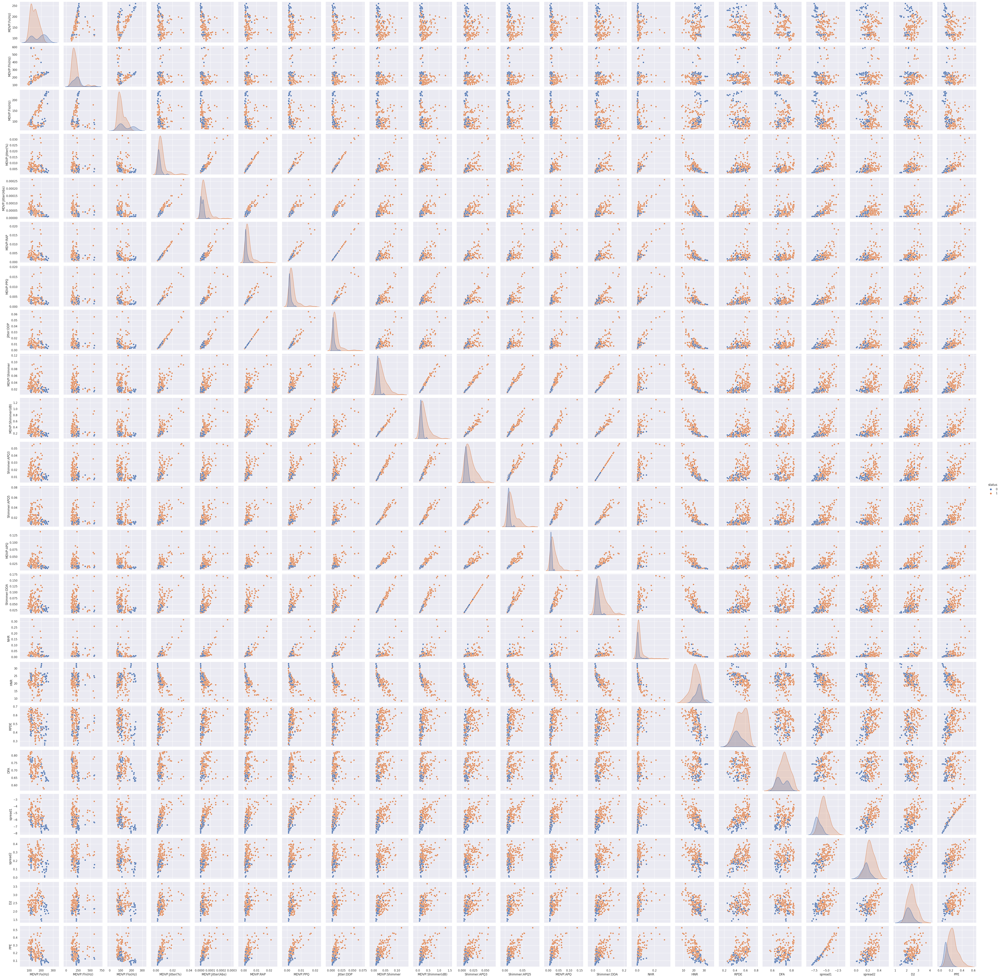

In [ ]:
import seaborn as sns
#Grafica General de resumen
%matplotlib inline

sns.set()#utilizar elementos graficos de siborn
sns.pairplot(df_park, hue="status")

## Variables relevantes RANDOM FOREST

In [ ]:
df_train, df_test=train_test_split(df_park,train_size=0.6,random_state=101)

#registros para train y test
train_x=df_train.drop(['status'],axis=1)
train_y=df_train['status']

test_x=df_test.drop(['status'],axis=1)
test_y=df_test['status']

In [ ]:
from sklearn.ensemble import RandomForestClassifier as RFC
from sklearn.metrics import  confusion_matrix

rf=RFC()

rf.fit(train_x,train_y)
rf_pred=rf.predict(test_x)

print('accuracy_score: ',accuracy_score(test_y,rf_pred))
confusion_matrix(rf_pred,test_y)

accuracy_score:  0.9358974358974359


array([[17,  1],
       [ 4, 56]])

In [ ]:
prob=rf.predict_proba(test_x.values)
p=np.array(rf_pred)
t=np.array(test_y)

print('resultados con error')
print('probabilidad','esperado','prediccion')

for i in range(len(prob)-1):
    if p[i]!=t[i]:
        print(' ',round(prob[i][1],2),'      ',t[i],'     ',p[i])

resultados con error
probabilidad esperado prediccion
  0.55        0       1
  0.57        0       1
  0.7        0       1
  0.47        1       0
  0.7        0       1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
# features importantes
feature_importances=pd.DataFrame(rf.feature_importances_,
                                index=train_x.columns,
                                columns=['importancia']).sort_values('importancia',ascending=False)
feature_importances[0:8]

,importancia
PPE,0.099048
MDVP:Fo(Hz),0.092250
spread1,0.078668
spread2,0.070175
MDVP:Fhi(Hz),0.069253
MDVP:APQ,0.065230
Shimmer:APQ5,0.052875
Shimmer:APQ3,0.046413


In [ ]:
columnas_relevantes=feature_importances.index[0:8]

## Entrenamiento con las columnas_relevantes, 3 modelos

In [ ]:
x=df_park[columnas_relevantes]
y=df_park['status']

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(x, y, test_size=0.4, random_state=101)

PREDICCIONES

In [ ]:
#Random Forest
rf=RFC()

rf.fit(x_train,y_train)
rf_pred=rf.predict(x_test)
rf_prob=rf.predict_proba(x_test)

print('accuracy_score: ',accuracy_score(rf_pred,y_test))
confusion_matrix(rf_pred,y_test)

accuracy_score:  0.9487179487179487


array([[18,  1],
       [ 3, 56]])

In [ ]:
#XGboost

#normalizacion de las variables antes de aplicar el algoritmo


x_train_norm=(x_train-x.min())/(x.max()-x.min())
x_test_norm=(x_test-x.min())/(x.max()-x.min())

xg=XGBClassifier()

xg.fit(x_train_norm,y_train)
xg_pred=xg.predict(x_test_norm)
xg_prob=xg.predict_proba(x_test_norm)
print('accuracy_score: ',accuracy_score(xg_pred,y_test))
confusion_matrix(xg_pred,y_test)

accuracy_score:  0.9102564102564102


array([[16,  2],
       [ 5, 55]])

In [ ]:
salida=pd.DataFrame()

salida['prob_forest']=[i[1] for i in rf_prob]
salida['pred_forest']=np.array(rf_pred)
salida['prob_xg']=[j[1] for j in xg_prob]
salida['pred_xgboost']=np.array(xg_pred)
salida['test']=np.array(y_test)

In [ ]:
salida.loc[(salida['pred_forest']!=salida['test']),['prob_forest','pred_forest','test']]

,prob_forest,pred_forest,test
13,0.65,1,0
57,0.68,1,0
60,0.40,0,1
66,0.61,1,0


In [ ]:
salida.loc[(salida['pred_xgboost']!=salida['test']),['prob_xg','pred_xgboost','test']]

,prob_xg,pred_xgboost,test
1,0.383722,0,1
13,0.970161,1,0
23,0.703291,1,0
57,0.983467,1,0
60,0.058249,0,1
66,0.697729,1,0
69,0.692453,1,0


In [ ]:
salida['prom_prob']=(salida['prob_forest']+salida['prob_xg'])/2
salida['prom_pred']=[1 if i > 0.5  else 0 for i in salida['prom_prob']]

In [ ]:
salida.loc[(salida['prom_pred']!=salida['test']),['prom_prob','prom_pred','test']]

,prom_prob,prom_pred,test
1,0.446861,0,1
13,0.810080,1,0
23,0.591645,1,0
57,0.831733,1,0
60,0.229125,0,1
66,0.653865,1,0
69,0.596226,1,0
